# OpenCV com Python
## funções basicas

Text(0.5, 1.0, 'Over the Clouds - gray')

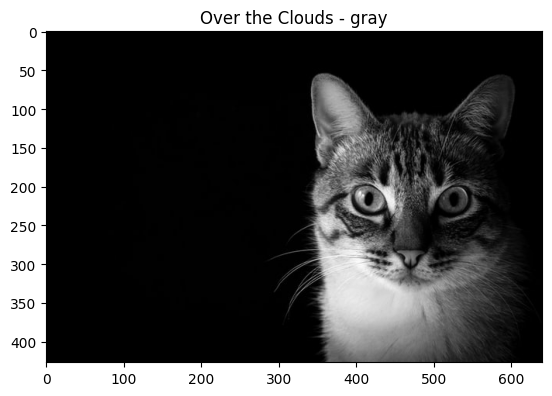

In [1]:
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('data//Photos//cat.jpg')

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

plt.imshow(gray, cmap = 'gray')
plt.title("Over the Clouds - gray")

Text(0.5, 1.0, 'Over the Clouds - original color image')

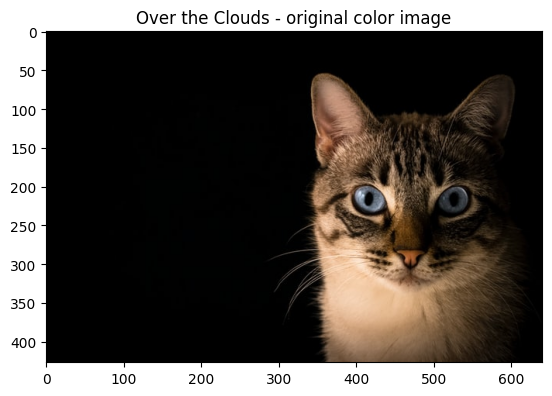

In [2]:
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Over the Clouds - original color image")

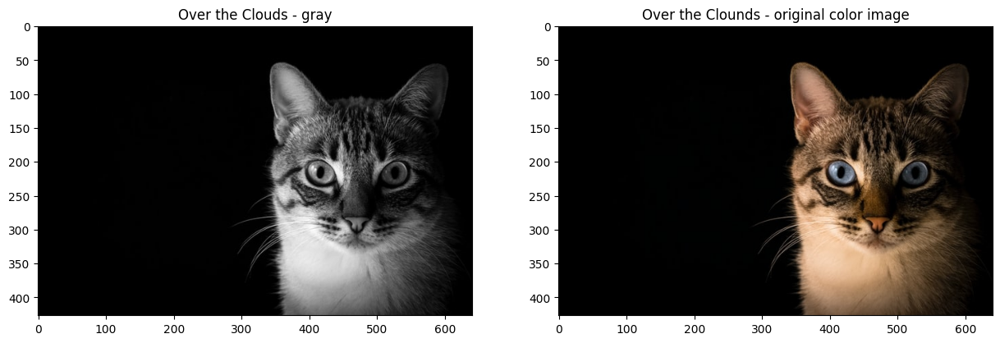

In [3]:
f = plt.figure(figsize=(15, 15))
f.add_subplot(1, 2, 1)
plt.imshow(gray, cmap = 'gray')
plt.title("Over the Clouds - gray")

f.add_subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
#plt.imshow(img)
plt.title("Over the Clounds - original color image")

cv.imshow('Cat',img)

# Reading video

In [2]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from IPython.display import display, Image
import ipywidgets as widgets
import threading

def plot(img):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [4]:
#cap = cv2.VideoCapture(0)
#cap.set(3,640) # adjust width
#cap.set(4,480) # adjust height

#while True:
#    success, img = cap.read()
#    cv2.imshow("Webcam", img) # This will open an independent window
#    if cv2.waitKey(1) & 0xFF==ord('q'): # quit when 'q' is pressed
#        cap.release()
#        break
        
#cv2.destroyAllWindows() 
#cv2.waitKey(1) # normally unnecessary, but it fixes a bug on MacOS where the window doesn't close


ToggleButton(value=False, button_style='danger', description='Stop', icon='square', tooltip='Description')

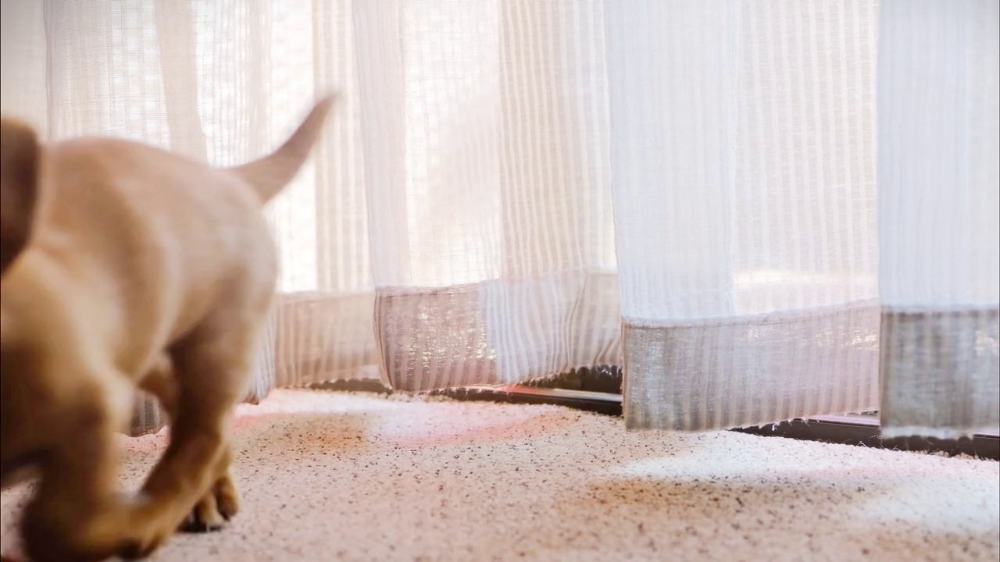

Exception in thread Thread-14 (view):
Traceback (most recent call last):
  File "C:\Users\UERJBotz\AppData\Local\Programs\Python\Python310\lib\threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "C:\Users\UERJBotz\AppData\Local\Programs\Python\Python310\lib\threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "C:\Users\UERJBotz\AppData\Local\Temp\ipykernel_63956\1000320393.py", line 23, in view
cv2.error: OpenCV(4.7.0) D:\a\opencv-python\opencv-python\opencv\modules\imgcodecs\src\loadsave.cpp:1109: error: (-215:Assertion failed) !image.empty() in function 'cv::imencode'



In [12]:
# Stop button
# ================
stopButton = widgets.ToggleButton(
    value=False,
    description='Stop',
    disabled=False,
    button_style='danger', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Description',
    icon='square' # (FontAwesome names without the `fa-` prefix)
)


# Display function
# ================
def view(button):
    #cap = cv2.VideoCapture(0)
    cap = cv2.VideoCapture('data/Videos/dog.mp4')
    display_handle=display(None, display_id=True)
    i = 0
    while True:
        _, frame = cap.read()
        frame = cv2.flip(frame, 1) # if your camera reverses your image
        _, frame = cv2.imencode('.jpeg', frame)
        display_handle.update(Image(data=frame.tobytes()))
        if stopButton.value==True:
            cap.release()
            display_handle.update(None)

            
# Run
# ================
display(stopButton)
thread = threading.Thread(target=view, args=(stopButton,))
thread.start()

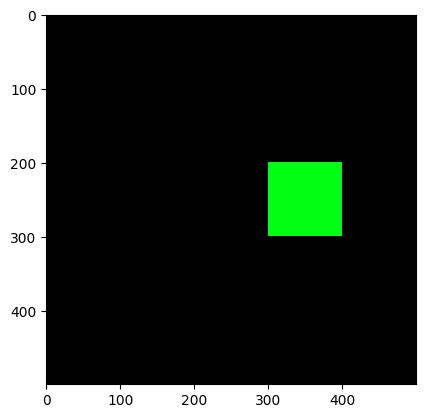

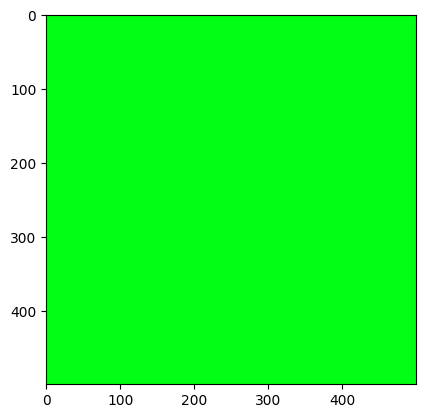

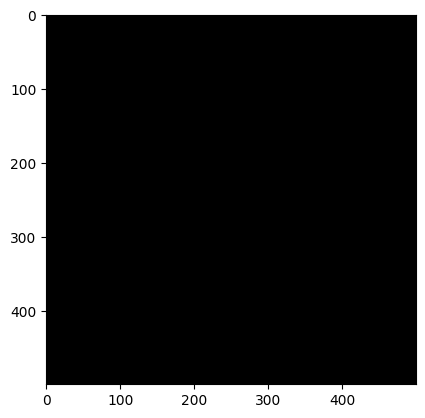

In [38]:
blank = np.zeros((500,500,3),dtype='uint8')

#img = cv2.imread('data//Photos//cat.jpg')

#img = cv2.imshow( 'Blank', blank )

#a = cv2.cvtColor( blank , cv2.COLOR_BGR2RGB)

# RGB
blank[200:300, 300:400] = 0,255,20
plt.imshow(blank)
plt.show()

# RGB
blank[:] = 0,255,20
plt.imshow(blank)
plt.show()

# RGB
blank[:] = 0,0,0
plt.imshow(blank)
plt.show()

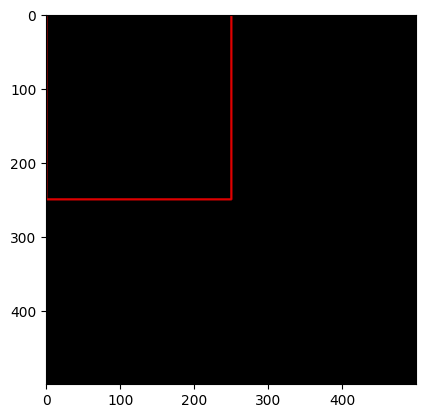

In [41]:
#rectangle
cv2.rectangle(blank, (0,0), (250,250), (222,0,0), thickness = 2)
plt.imshow(blank)

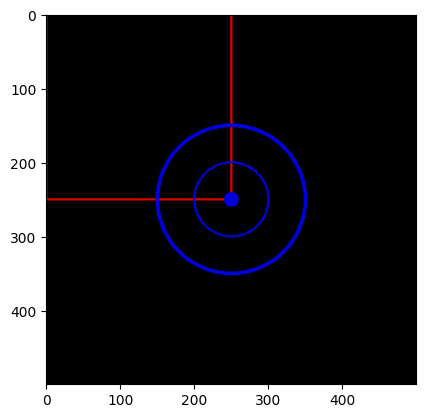

In [44]:
#circle
cv2.circle(blank, (blank.shape[0]//2,blank.shape[1]//2), 10, (0,0,222), thickness = -3)
plt.imshow(blank)

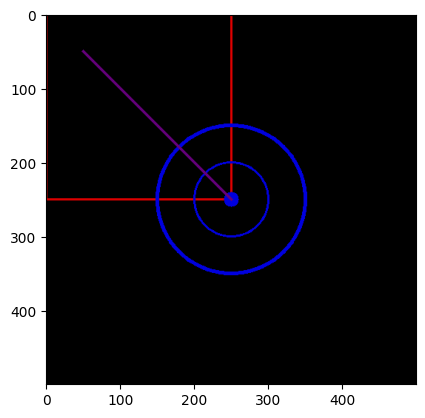

In [50]:
#line
cv2.line(blank, (50,50), (blank.shape[0]//2,blank.shape[1]//2), (100,0,122), thickness = 3)
plt.imshow(blank)

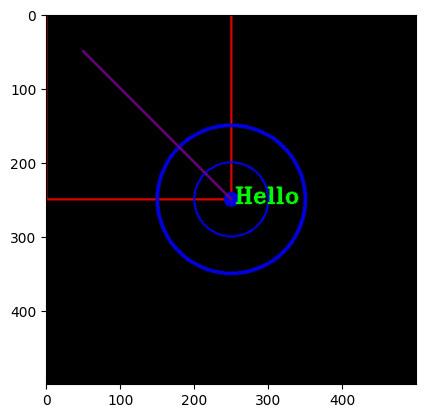

In [52]:
#Text
cv2.putText(blank, 'Hello', (255,255), cv2.FONT_HERSHEY_TRIPLEX, 1.0, (0,250,0), 2)
plt.imshow(blank)

# Funções essenciais

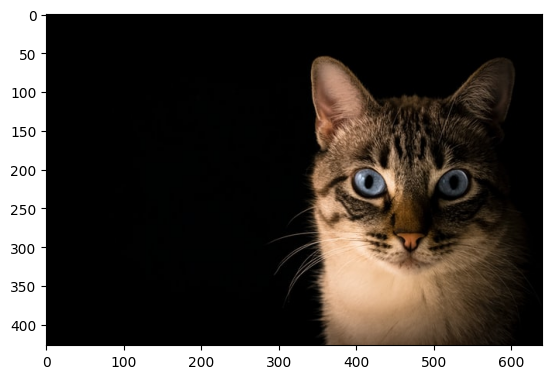

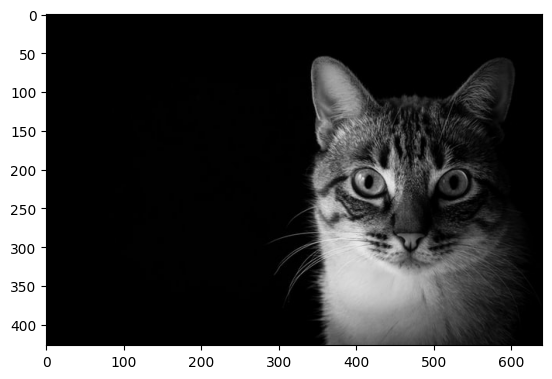

In [60]:
#Text
img = cv2.imread("data/Photos/cat.jpg")
plot(img)
plt.show()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plot(gray)
plt.show()

# Blur

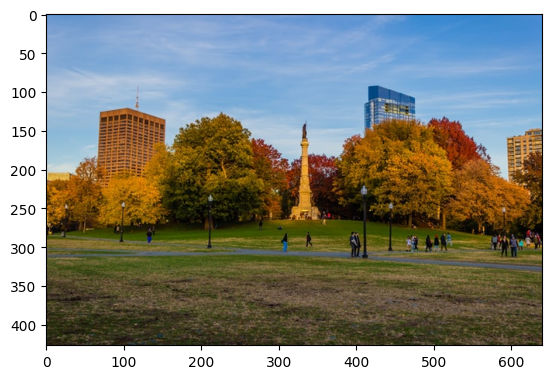

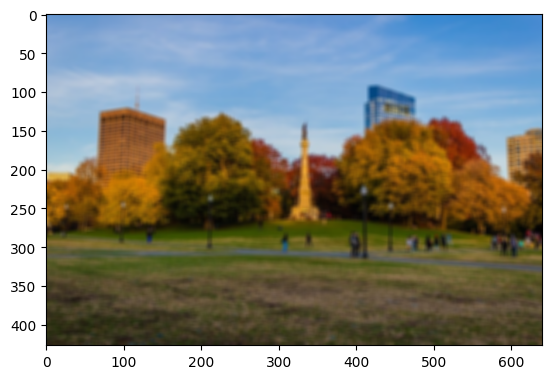

In [74]:
img = cv2.imread("data/Photos/park.jpg")

plot(img)
plt.show()

blur = cv2.GaussianBlur( img, (7,7), cv2.BORDER_DEFAULT )
plot(blur)

# Edge cascade

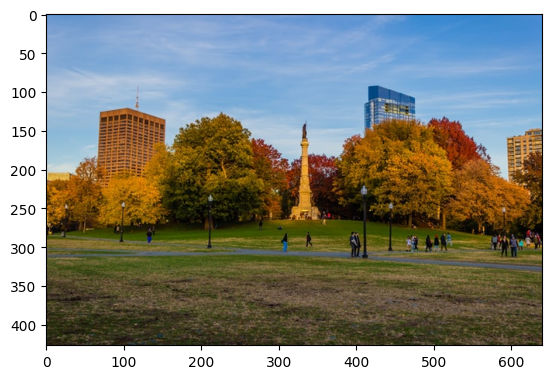

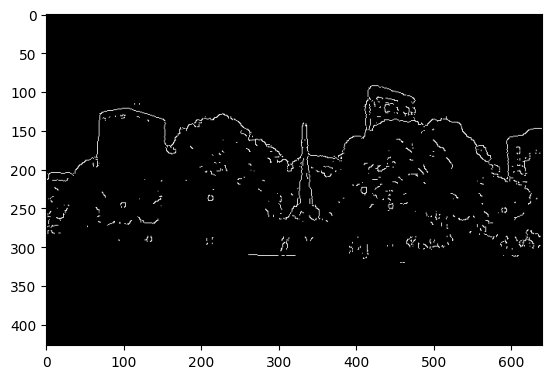

In [75]:
img = cv2.imread("data/Photos/park.jpg")

plot(img)
plt.show()

canny = cv2.Canny( blur, 127,125 )
plot(canny)

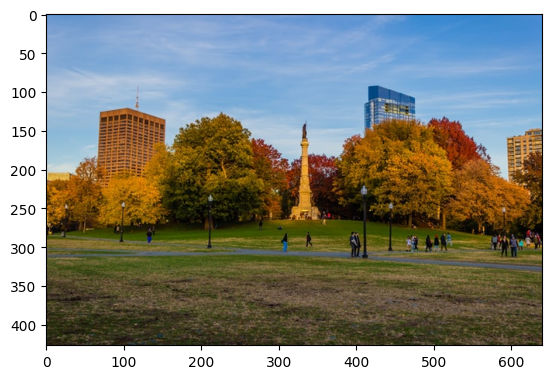

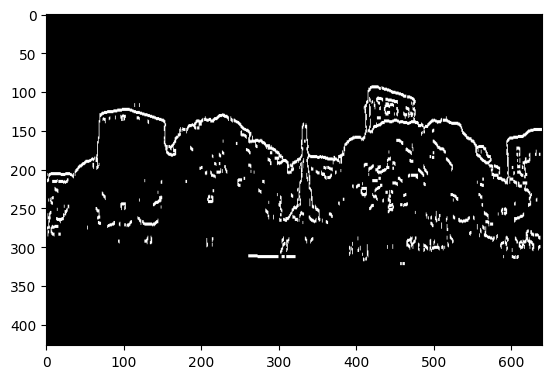

In [79]:
plot(img)
plt.show()

dilated = cv2.dilate( canny, (7,7), iterations=3)
plot(dilated)

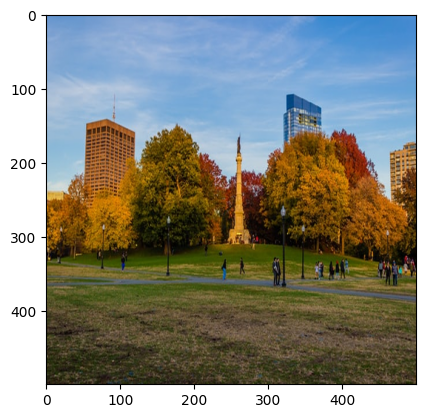

In [84]:
# Resize
resize = cv2.resize(img, (500,500), interpolation = cv2.INTER_CUBIC)
plot(resize)

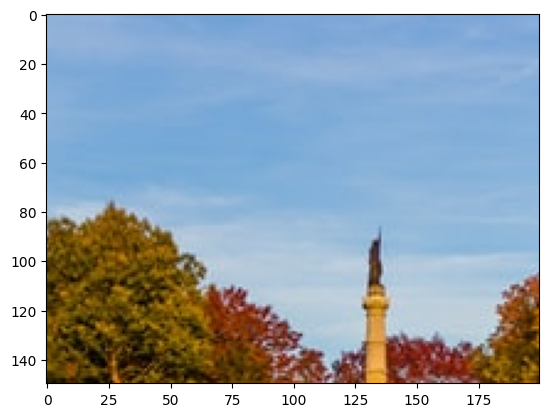

In [85]:
# Crop
cropped = img[50:200, 200:400]
plot(cropped)

# Image Transformation

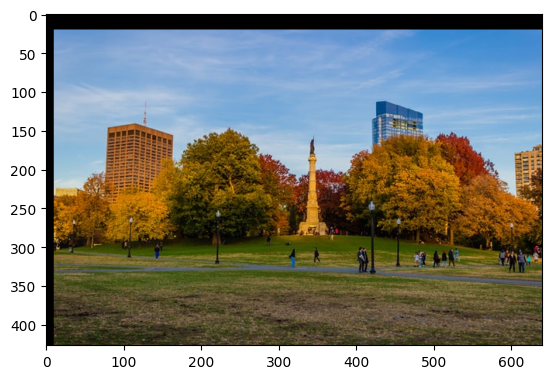

In [93]:
img = cv2.imread("data/Photos/park.jpg")
# Translation
def translate(a, x, y):
    transMat = np.float32( [[1,0,x],[0,1,y]] )
    dimensions = (a.shape[1],a.shape[0])
    return cv2.warpAffine( a, transMat, dimensions )
plot(translate(img,10,20))

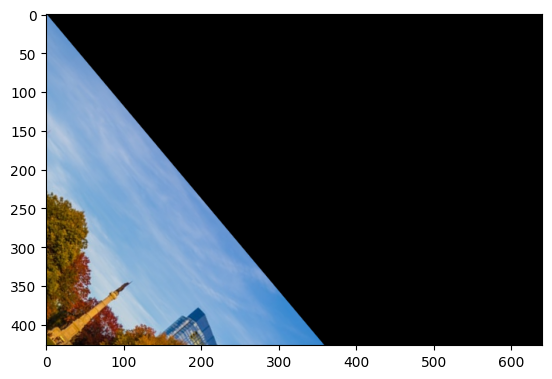

In [102]:
img = cv2.imread("data/Photos/park.jpg")

# Rotation
def rotate(a, angle, rotPoint=None):
    (height,width) = a.shape[:2]
    if rotPoint is None:
        rotPoint = (width//2,height//2)
    rotMat = cv2.getRotationMatrix2D( rotPoint, angle, 1.0 )
    dimensions = (a.shape[1],a.shape[0])
    return cv2.warpAffine( a, rotMat, dimensions )

plot(rotate(img,-50,(0,0)))

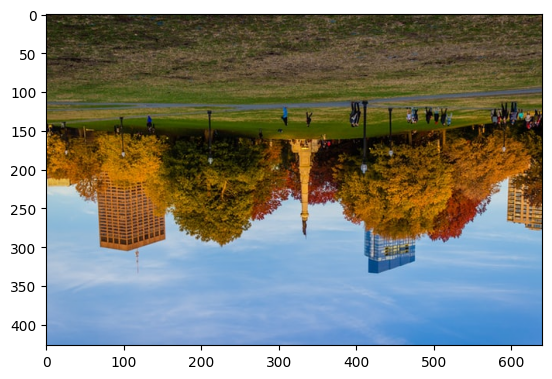

In [107]:
img = cv2.imread("data/Photos/park.jpg")

# Flip
flip = cv2.flip(img,0)
plot(flip)

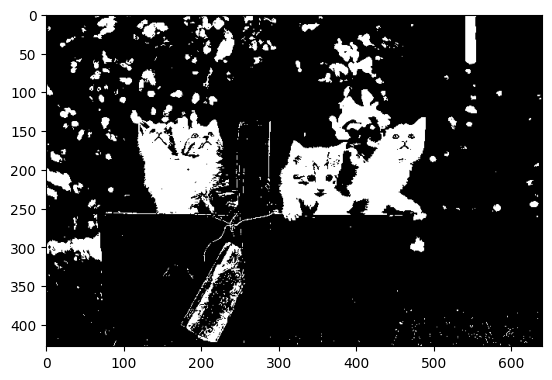

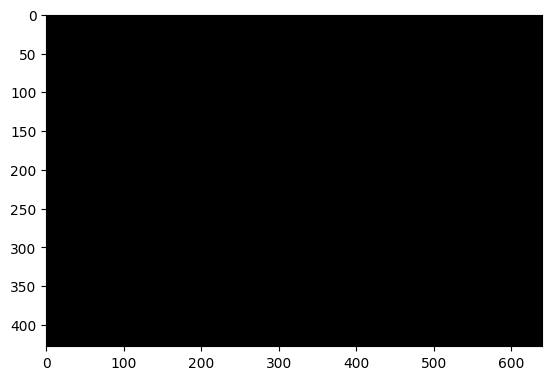

Contours839


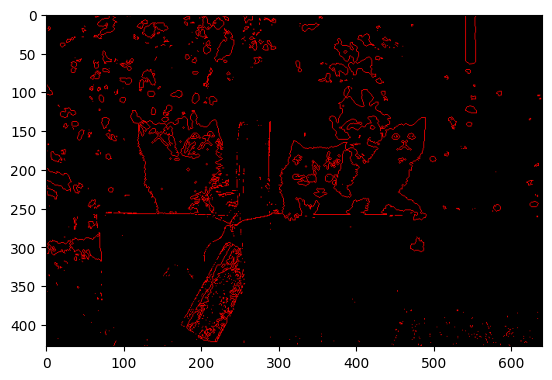

In [133]:
img = cv2.imread("data/Photos/cats.jpg")

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

blur = cv2.GaussianBlur(gray,(5,5),cv2.BORDER_DEFAULT)

canny = cv2.Canny(blur, 125, 175)

ret, thresh = cv2.threshold(gray, 125, 255, cv2.THRESH_BINARY)

plot(thresh)
plt.show()

blank = np.zeros(img.shape,dtype='uint8')
plot(blank)
plt.show()

#contours, hierarchies = cv2.findContours(canny, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
contours, hierarchies = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

print(f"Contours{len(contours)}")

cv2.drawContours(blank, contours, -1, (0,0,255), 1)

plot(blank)
plt.show()

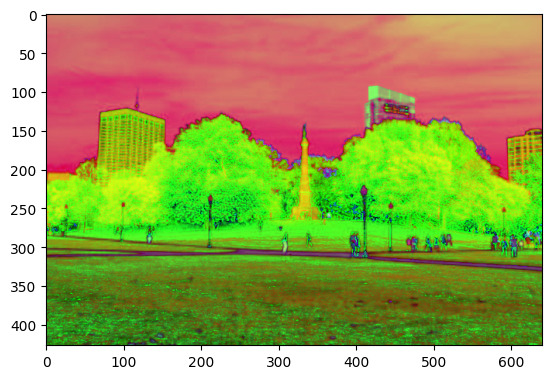

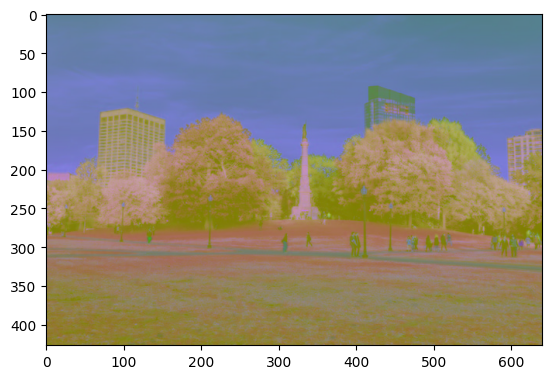

In [135]:
# Color spaces
img = cv2.imread("data/Photos/park.jpg")

hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

plot(hsv)
plt.show()

lab = cv2.cvtColor(img,cv2.COLOR_BGR2LAB)

plot(lab)
plt.show()

blue


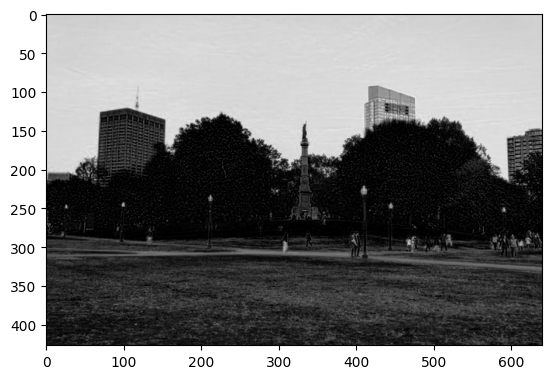

green


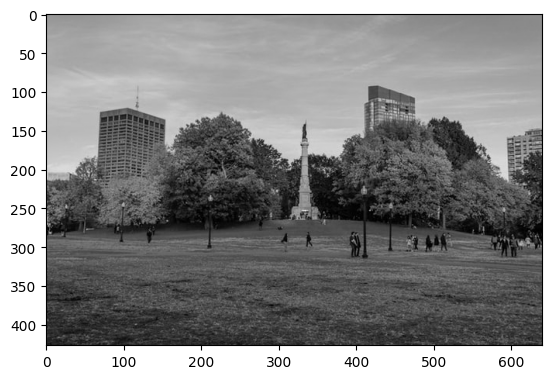

red


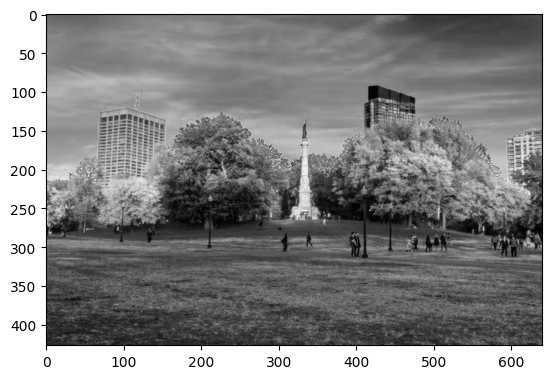

merged


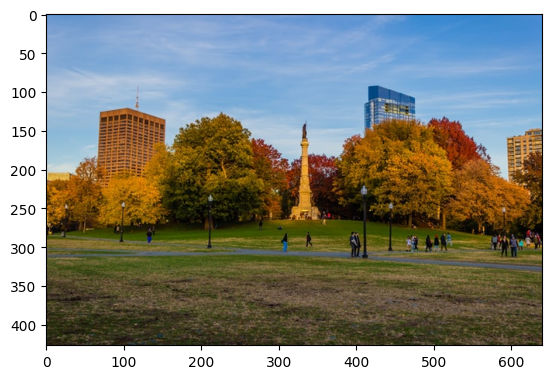

blue


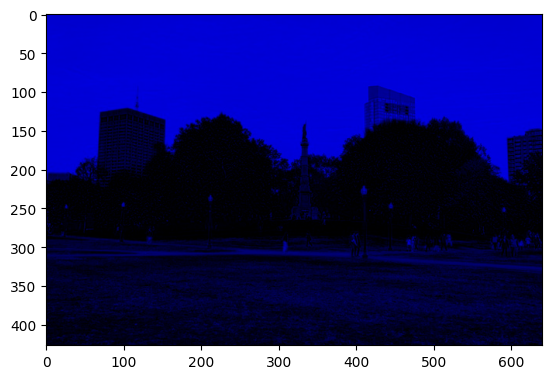

green


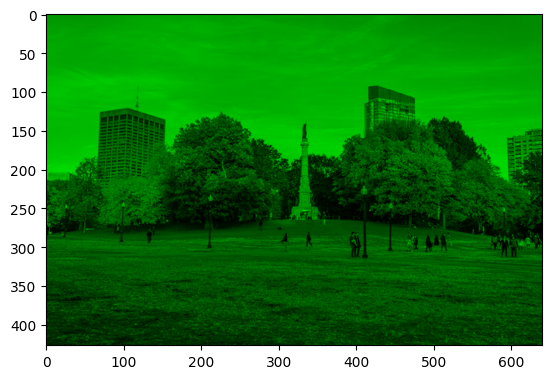

red


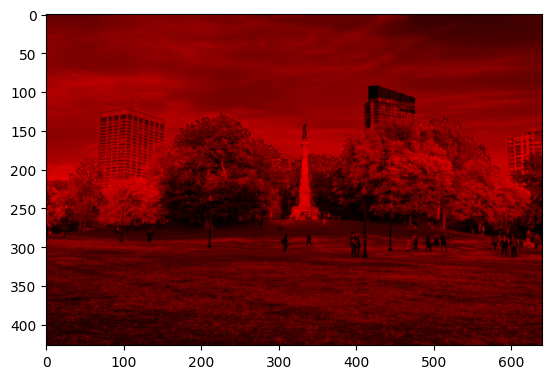

In [142]:
# Color channels
img = cv2.imread("data/Photos/park.jpg")

b, g, r = cv2.split(img)

print("blue"); plot(b); plt.show()
print("green"); plot(g); plt.show()
print("red"); plot(r); plt.show()

merged = cv2.merge([b,g,r])

print("merged"); plot(merged); plt.show()


blank = np.zeros( img.shape[:2], dtype='uint8' )

print("blue");  plot(cv2.merge([b,blank,blank])); plt.show()
print("green"); plot(cv2.merge([blank,g,blank])); plt.show()
print("red");   plot(cv2.merge([blank,blank,r])); plt.show()

H


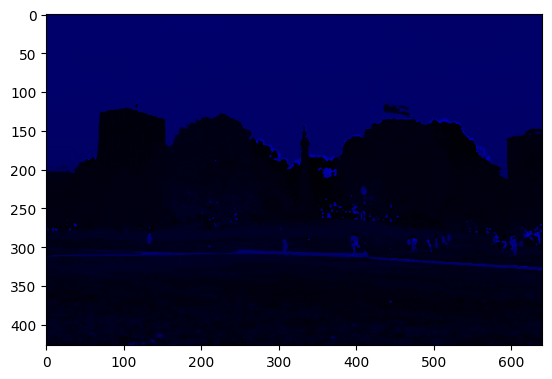

S


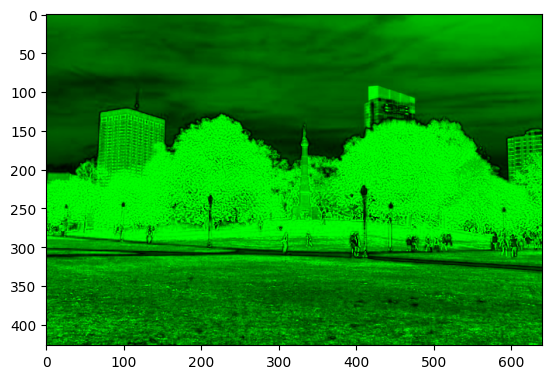

V


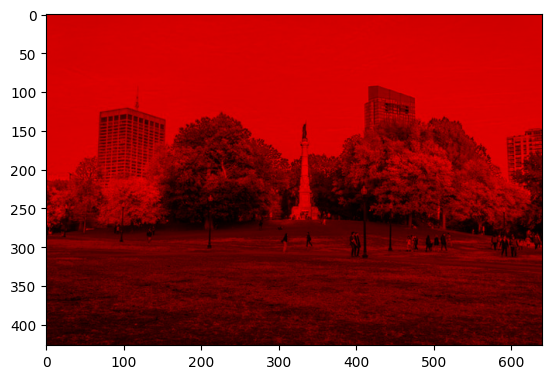

H -> MIN: 0 MAX: 179


In [148]:
# Color channels
img = cv2.imread("data/Photos/park.jpg")

img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

H, S, V = cv2.split(img)

blank = np.zeros( img.shape[:2], dtype='uint8' )

print("H"); plot(cv2.merge([H,blank,blank])); plt.show()
print("S"); plot(cv2.merge([blank,S,blank])); plt.show()
print("V"); plot(cv2.merge([blank,blank,V])); plt.show()

print(f"H -> MIN: {np.amin(H)} MAX: {np.amax(H)}")

# Blur

# Bitwise

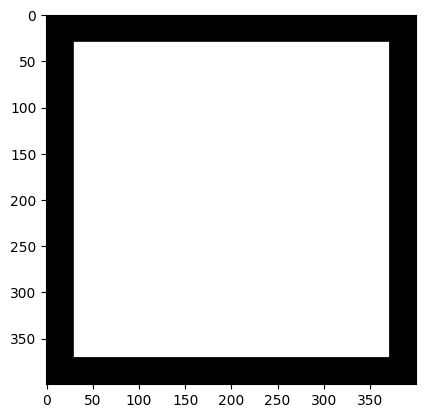

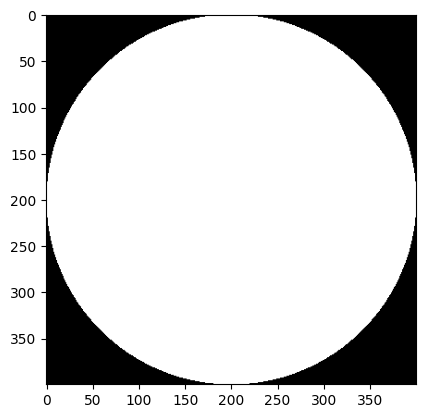

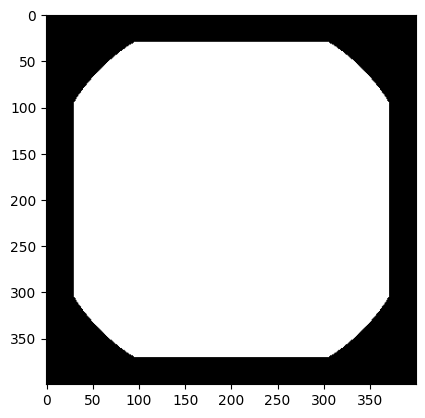

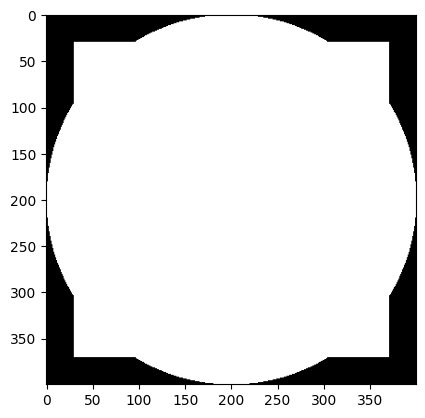

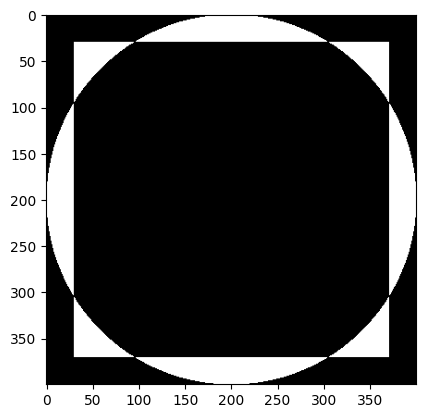

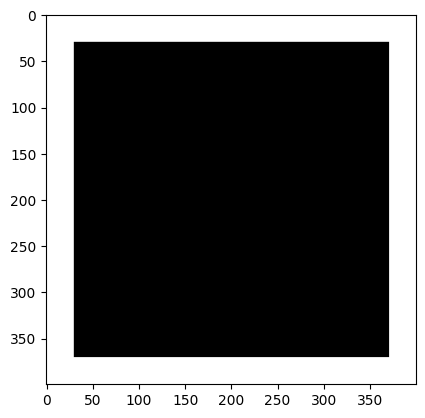

In [7]:
blank = np.zeros( (400,400), dtype='uint8' )

rect   = cv2.rectangle( blank.copy(), (30,30), (370,370), 255, -1 )
circle = cv2.circle( blank.copy(), (200,200), 200, 255, -1 )

plot(rect); plt.show()
plot(circle); plt.show()
plot(bitwise_or); plt.show()

# bitwise AND
bitwise_and = cv2.bitwise_and(rect,circle)
plot(bitwise_and); plt.show()

# bitwise OR
bitwise_or = cv2.bitwise_or(rect,circle)
plot(bitwise_or); plt.show()

# bitwise XOR
bitwise_xor = cv2.bitwise_xor(rect,circle)
plot(bitwise_xor); plt.show()

# bitwise NOT
bitwise_not = cv2.bitwise_not(rect)
plot(bitwise_not); plt.show()


# Masking

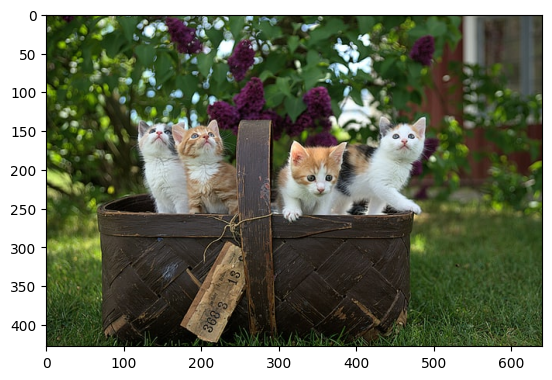

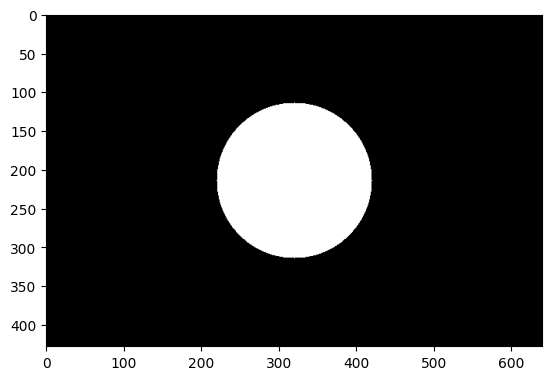

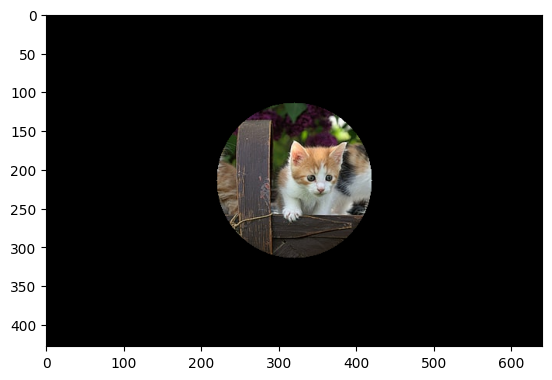

In [11]:
img = cv2.imread("data/Photos/cats.jpg")
plot(img); plt.show()

blank = np.zeros( img.shape[:2], dtype='uint8' )

mask = cv2.circle( blank, (img.shape[1]//2,img.shape[0]//2), 100, 255, -1 )

plot(mask); plt.show()

# bitwise AND
bitwise_and = cv2.bitwise_and(img,img,mask=mask)
plot(bitwise_and); plt.show()



# Histograms

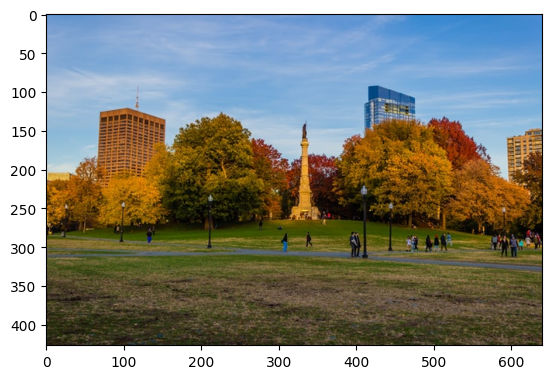

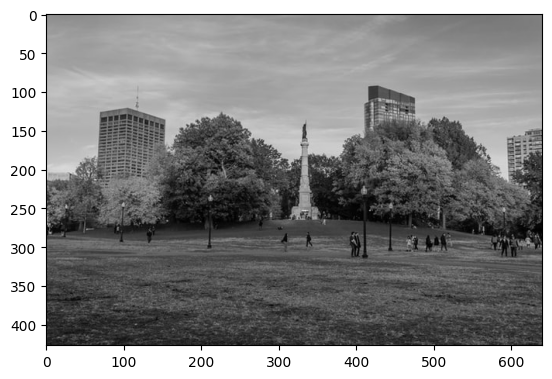

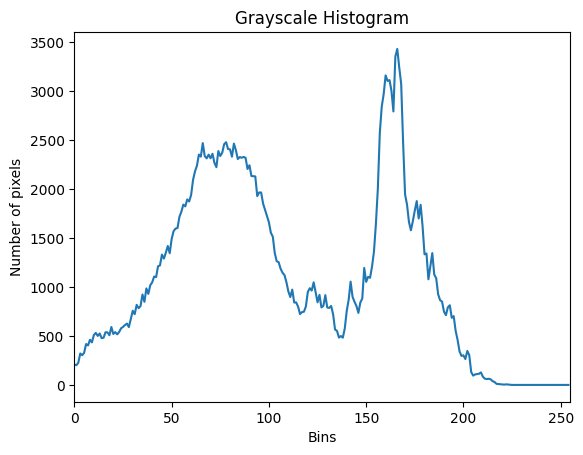

In [24]:
img = cv2.imread("data/Photos/park.jpg")
plot(img); plt.show()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plot(gray); plt.show()

#Grayscale Histogram
gray_hist = cv2.calcHist([gray],[0],None,[255],[0,256])

plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Bins')
plt.ylabel('Number of pixels')
plt.plot(gray_hist)
plt.xlim([0,255])
plt.show()

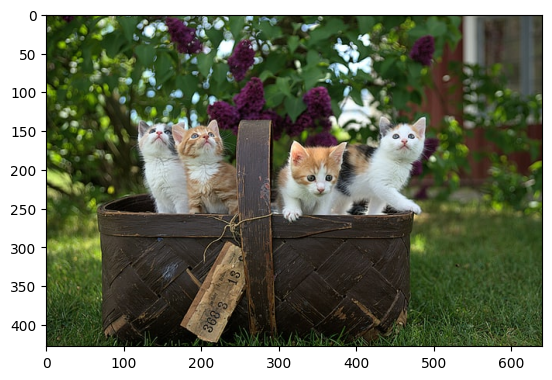

[6100.]
[634.]
[974.]


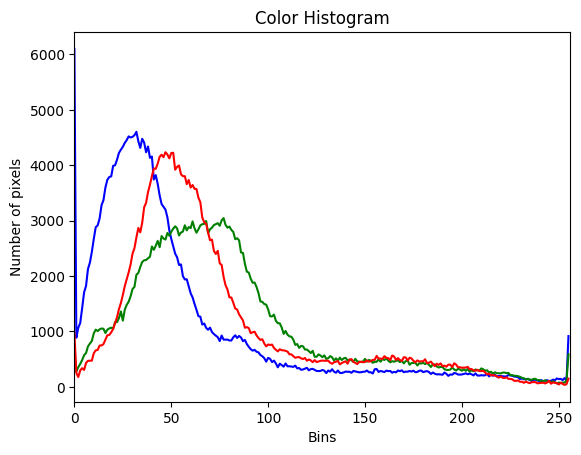

In [46]:
# Color Histogram
img = cv2.imread("data/Photos/cats.jpg")
plot(img); plt.show()

plt.figure()
plt.title('Color Histogram')
plt.xlabel('Bins')
plt.ylabel('Number of pixels')
colors = ('b','g','r')
for i,col in enumerate(colors):
    hist = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(hist,color=col)
    print(hist[0])
    plt.xlim([0,256])
plt.show()

# Thresholding

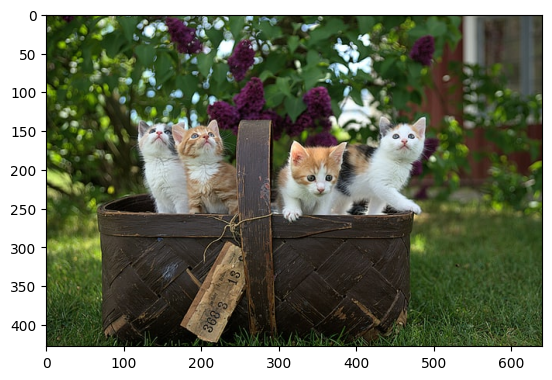

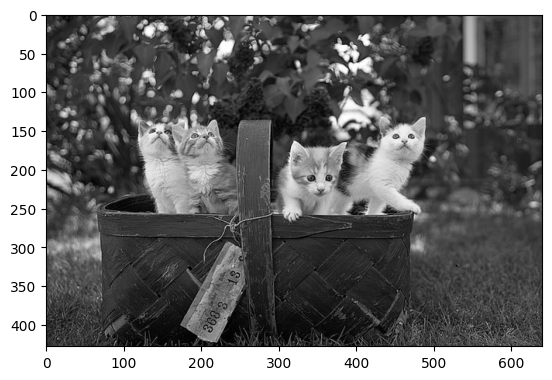

(428, 640)


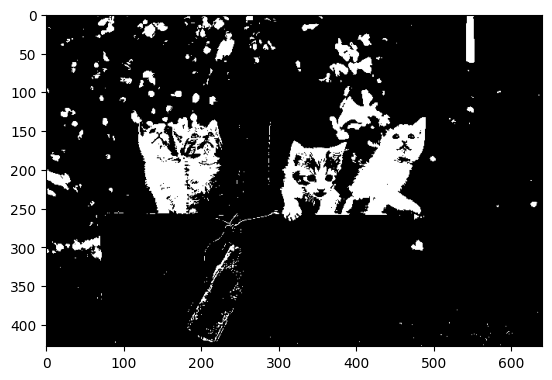

In [58]:
# Simple Thresholding
img = cv2.imread("data/Photos/cats.jpg")
plot(img); plt.show()

# - gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plot(gray); plt.show()

threshold, thresh = cv2.threshold( gray, 150, 255, cv2.THRESH_BINARY )
plot(thresh)

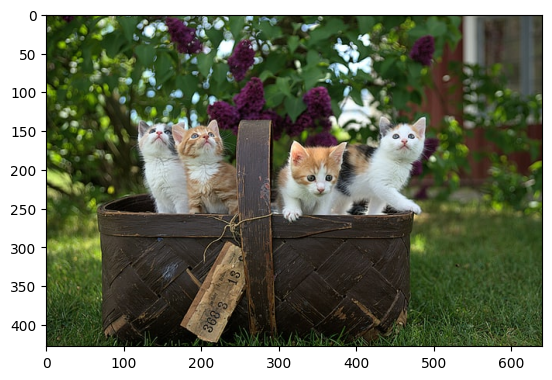

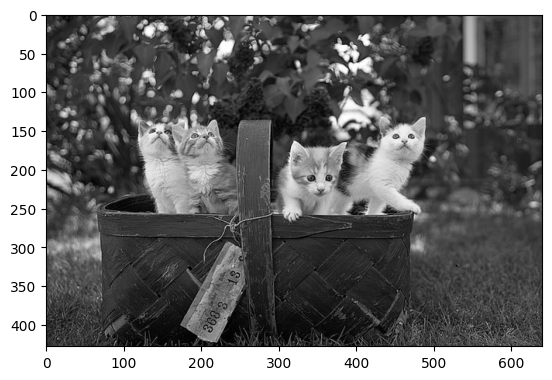

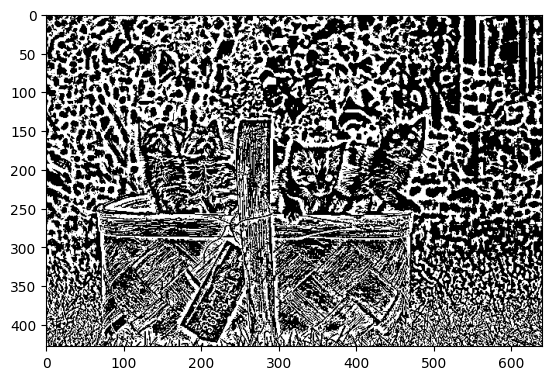

In [57]:
# Adaptative Thresholding
img = cv2.imread("data/Photos/cats.jpg")
plot(img); plt.show()

# - gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plot(gray); plt.show()

#adaptive_thresh = cv2.adaptiveThreshold( gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 3 )
adaptive_thresh = cv2.adaptiveThreshold( gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 3 )
plot(adaptive_thresh)

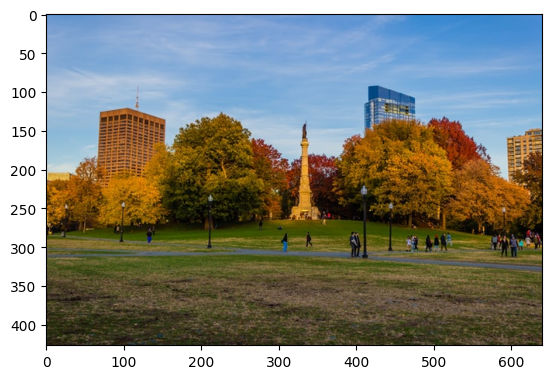

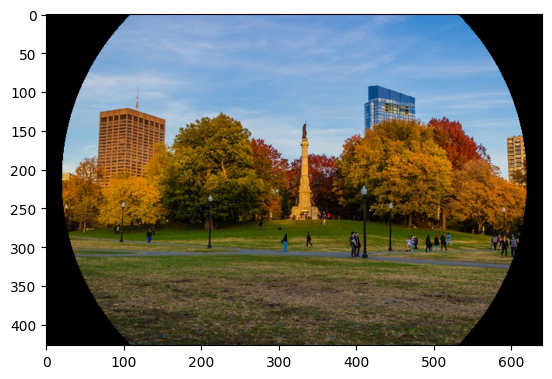

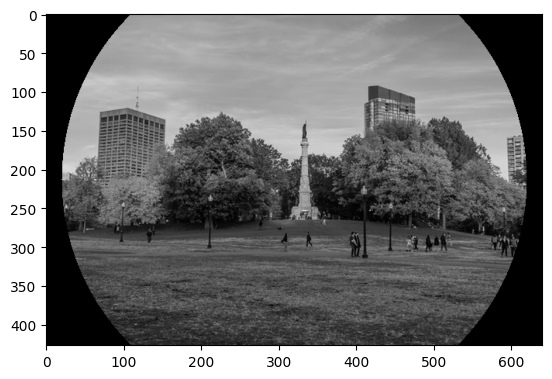

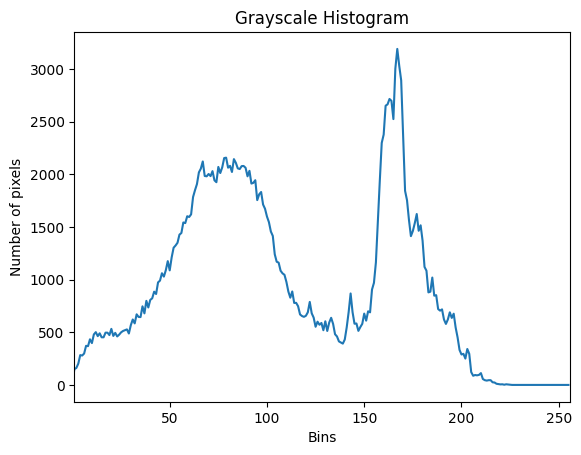

In [38]:
img = cv2.imread("data/Photos/park.jpg")
plot(img); plt.show()

blank  = np.zeros( img.shape[:2], dtype='uint8' )
mask   = cv2.circle( blank, (img.shape[1]//2,img.shape[0]//2), 300, 255, -1 )
masked = cv2.bitwise_and(img,img,mask=mask)
plot(masked); plt.show()

gray = cv2.cvtColor(masked, cv2.COLOR_BGR2GRAY)
plot(gray); plt.show()

#Grayscale Histogram
gray_hist = cv2.calcHist([gray],[0],mask,[256],[0,256])

plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Bins')
plt.ylabel('Number of pixels')
plt.plot(gray_hist)
plt.xlim([1,256])
plt.show()

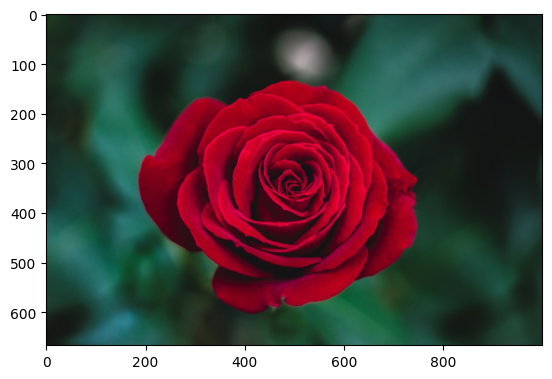

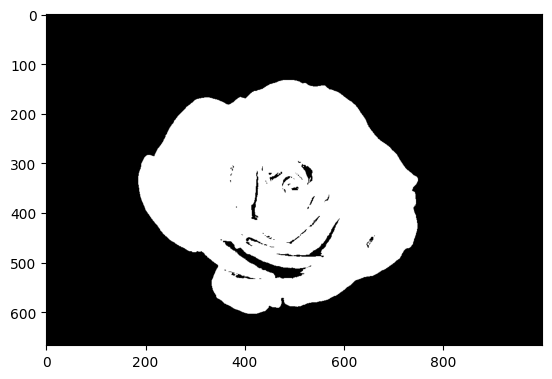

NameError: name 'threshold' is not defined

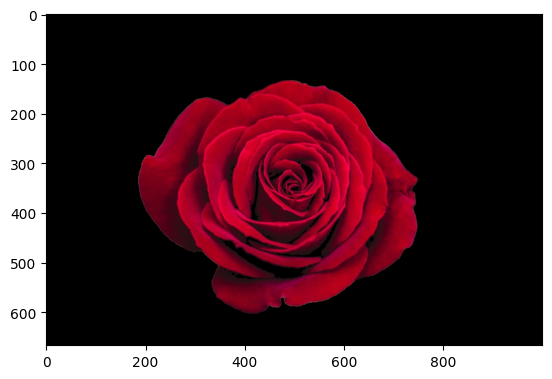

In [48]:
image = cv2.imread('rose.jpg')

plot(image)
plt.show()

result = image.copy()
 
image = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
 
# lower boundary RED color range values; Hue (0 - 10)
lower1 = np.array([0, 100, 20])
upper1 = np.array([10, 255, 255])
 
# upper boundary RED color range values; Hue (160 - 180)
lower2 = np.array([160,100,20])
upper2 = np.array([179,255,255])
 
lower_mask = cv2.inRange(image, lower1, upper1)
upper_mask = cv2.inRange(image, lower2, upper2)
 
full_mask = lower_mask + upper_mask;
 
result = cv2.bitwise_and(result, result, mask=full_mask)
 
plot(full_mask)
plt.show()

plot(result)
plt.show(threshold)

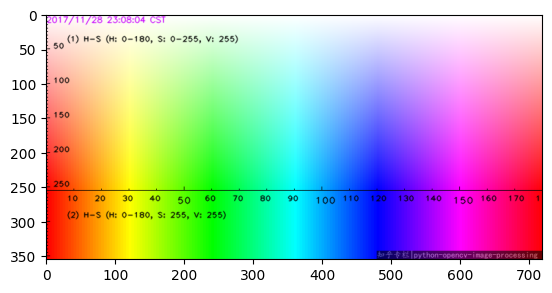

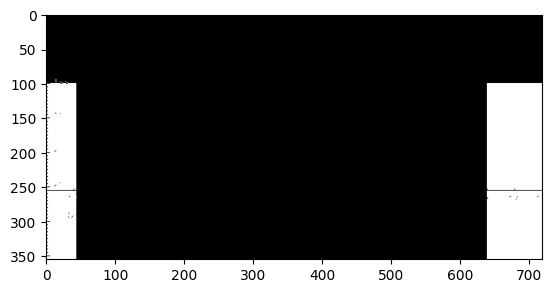

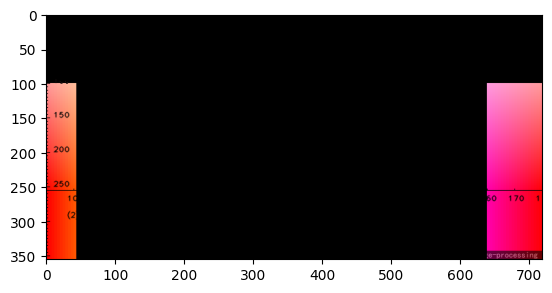

In [156]:
image = cv2.imread('hue.png')

plot(image)
plt.show()

result = image.copy()
 
image = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
 
# lower boundary RED color range values; Hue (0 - 10)
lower1 = np.array([0, 100, 20])
upper1 = np.array([10, 255, 255])
 
# upper boundary RED color range values; Hue (160 - 180)
lower2 = np.array([160,100,20])
upper2 = np.array([179,255,255])
 
lower_mask = cv2.inRange(image, lower1, upper1)
upper_mask = cv2.inRange(image, lower2, upper2)
 
full_mask = lower_mask + upper_mask;
 
result = cv2.bitwise_and(result, result, mask=full_mask)
 
plot(full_mask)
plt.show()

plot(result)
plt.show()

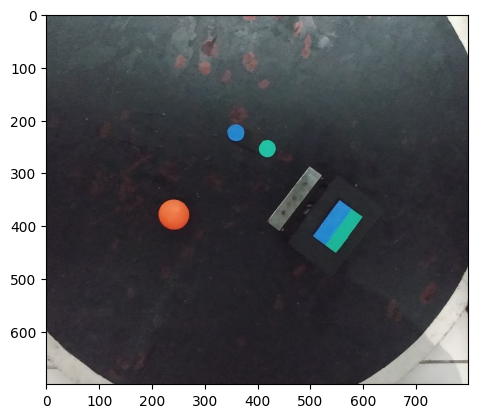

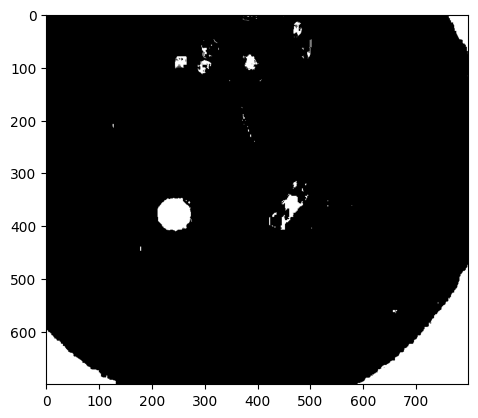

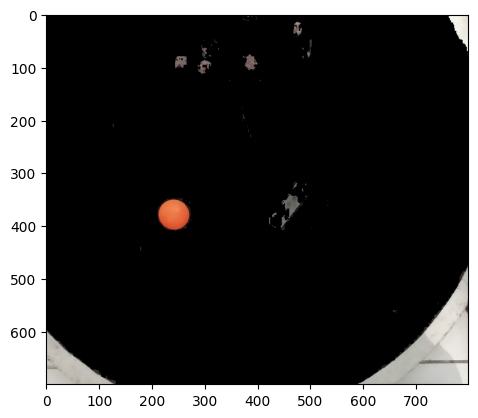

In [200]:
def filterColor(im):
    plot(im)
    plt.show()
    
    result = im.copy()
    im = cv2.cvtColor(im,cv2.COLOR_BGR2HSV)
    
    # lower boundary RED color range values; Hue (0 - 10)
    lower1 = np.array([0, 0, 0])
    upper1 = np.array([50, 255, 255])
    
    lower_mask = cv2.inRange(im, lower1, upper1)
    
    full_mask = lower_mask;
    result = cv2.bitwise_and(result, result, mask=full_mask)
    
    plot(full_mask)
    plt.show()
    
    plot(result)
    plt.show()
    
image = cv2.imread('dohyo_1.jpg')
image = image[0:700,300:1100]

# Crop
#cropped = image[50:200, 200:400]
#plot(cropped)

filterColor(image)